In [1]:
import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import cv2
import shutil
import pickle
import datetime
import scipy as sp
from scipy import linalg
from skimage import img_as_ubyte
from xml.etree import cElementTree as ElementTree
import tensorflow as tf
from tensorflow.keras.layers import concatenate
from tensorflow.keras.layers import Conv2D, SeparableConv2D
from tensorflow.keras.layers import Flatten, Dense, Activation
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.layers import MaxPooling2D, AveragePooling2D
from tensorflow.keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D
from tensorflow.python.client import device_lib
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.callbacks import TensorBoard, ReduceLROnPlateau, EarlyStopping

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


```
Environment
```

In [2]:
tf.keras.__version__

'2.3.0-tf'

In [3]:
tf.__version__

'2.2.0-rc3'

In [4]:
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 6791675207572200710, name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 6167036836661017396
 physical_device_desc: "device: XLA_CPU device", name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 9163714199696093503
 physical_device_desc: "device: XLA_GPU device", name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 15701463552
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 16104315102507413925
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"]

```
Code to extract information from xml annotation
```

In [0]:
class XmlListConfig(list):
    def __init__(self, aList):
        for element in aList:
            if element:
                # treat like dict
                if len(element) == 1 or element[0].tag != element[1].tag:
                    self.append(XmlDictConfig(element))
                # treat like list
                elif element[0].tag == element[1].tag:
                    self.append(XmlListConfig(element))
            elif element.text:
                text = element.text.strip()
                if text:
                    self.append(text)

class XmlDictConfig(dict):

    def __init__(self, parent_element):
        if parent_element.items():
            self.update(dict(parent_element.items()))
        for element in parent_element:
            if element:
                if len(element) == 1 or element[0].tag != element[1].tag:
                    aDict = XmlDictConfig(element)
                else:
                    aDict = {element[0].tag: XmlListConfig(element)}
                if element.items():
                    aDict.update(dict(element.items()))
                self.update({element.tag: aDict})
            elif element.items():
                self.update({element.tag: dict(element.items())})
            else:
                self.update({element.tag: element.text})

```
Organizing the data on my drive
```

In [0]:
root_data = 'drive/My Drive/Colab Notebooks/P6/data/'  # Root data folder

In [0]:
root_images = 'drive/My Drive/Colab Notebooks/P6/data/Images'  # Images folder

In [0]:
root_annotation = 'drive/My Drive/Colab Notebooks/P6/data/annotation/Annotation' # Annotation xml folder

In [0]:
dir_train = 'drive/My Drive/Colab Notebooks/P6/data/train'

In [0]:
dir_test = 'drive/My Drive/Colab Notebooks/P6/data/test'

In [0]:
dir_model = 'drive/My Drive/Colab Notebooks/P6/data/model/'

```
Functions to save and load objects
```

In [0]:
def save_obj(obj, name):
    with open(root_data + 'obj/'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name):
    with open(root_data + 'obj/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

**Prepare Data**
```
Extract information about on dog images : filename, breed, height, width
```

In [0]:
directory_annotation_names = [x[0] for x in os.walk(root_annotation)][1:]

In [0]:
filenames = []
categories = []
widths = []
heights = []
count = 0
for dir_an_name in directory_annotation_names:
    directory = dir_an_name.split('/')[-1]
    filenames_dir = os.listdir(dir_an_name)
    xml_string = open(root_annotation + "/" + directory + "/" + filenames_dir[0], "r+").read()
    root_xml = ElementTree.XML(xml_string)
    xmldict = XmlDictConfig(root_xml)
    for filename_dir in filenames_dir:
        if os.path.isfile(root_images + "/" + directory + "/" + filename_dir + ".jpg"): 
            filenames.append(filename_dir + ".jpg")
            categories.append(xmldict['object']['name'])
            widths.append(xmldict['size']['width'])
            heights.append(xmldict['size']['height'])
        else:
            count += 1

In [0]:
data = pd.DataFrame({
    'filename': filenames,
    'category': categories,
    'widths': widths,
    'heights': heights
})

In [0]:
# Save data object
save_obj(data, 'data')

```
View DataFrame and distribution
```

In [0]:
data = load_obj('data')

In [14]:
data

,filename,category,widths,heights
0,n02110185_5973.jpg,Siberian_husky,500,375
1,n02110185_2614.jpg,Siberian_husky,500,375
2,n02110185_8327.jpg,Siberian_husky,500,375
3,n02110185_4133.jpg,Siberian_husky,500,375
4,n02110185_14650.jpg,Siberian_husky,500,375
...,...,...,...,...
20575,n02093647_120.jpg,Bedlington_terrier,237,360
20576,n02093647_2585.jpg,Bedlington_terrier,237,360
20577,n02093647_2068.jpg,Bedlington_terrier,237,360
20578,n02093647_3219.jpg,Bedlington_terrier,237,360


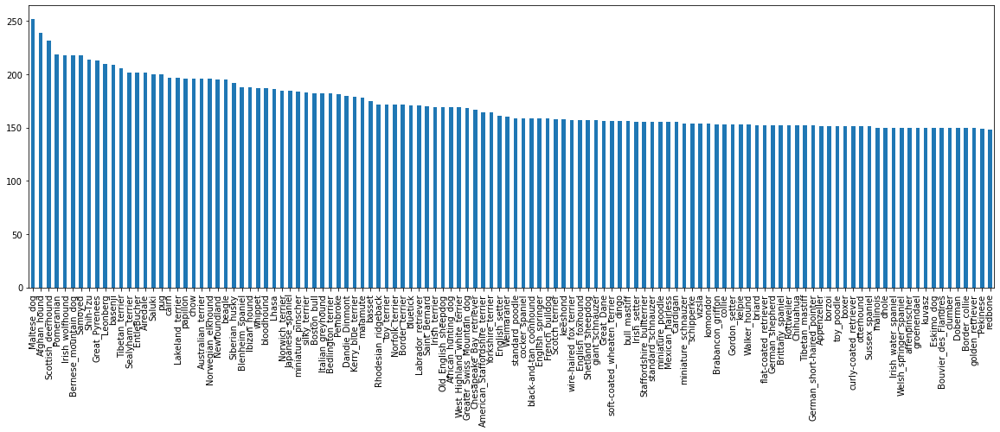

In [0]:
plt.figure(figsize=(20, 6))
data['category'].value_counts().plot.bar()

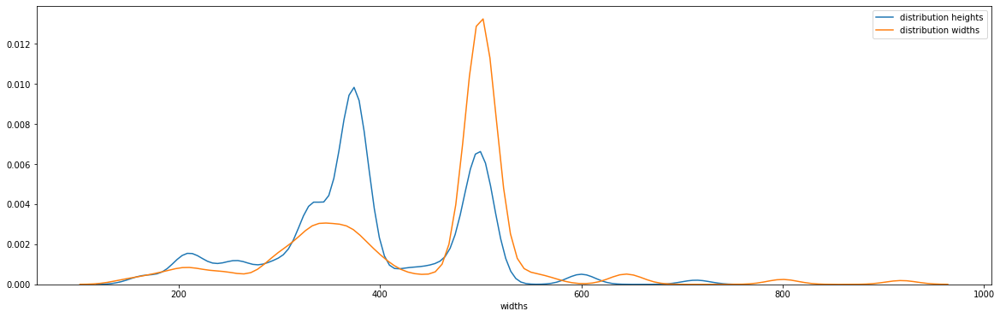

In [0]:
plt.figure(figsize=(20, 6))
sns.distplot(data['heights'], hist=False, label="distribution heights")
sns.distplot(data['widths'], hist=False, label="distribution widths")

```
Split train and test data
```

In [14]:
df = data.groupby('category').head(137)  # train_df has the same distribution of dog breeds
df.shape[0]

16440

In [15]:
validate_df = df.groupby('category').head(35)
validate_df.shape[0]

4200

In [16]:
train_df = df.loc[df.index.difference(validate_df.index)]
train_df.shape[0]

12240

In [17]:
test_df = data.loc[data.index.difference(df.index)]
test_df.shape[0]

4140

```
Create the train and test folder images on drive
```

In [0]:
# Delete train and test folder if exist

if os.path.isdir(dir_train):
    #shutil.rmtree(dir_train)

if os.path.isdir(dir_test):
    #shutil.rmtree(dir_test)

In [0]:
# Create train and test directories

os.mkdir(dir_train)
os.mkdir(dir_test)

In [0]:
# Copy the files
file_error_train = []
for i, row in df.iterrows():
    path = root_images + "/" + row['directory'] + "/" + row['filename']
    if os.path.isfile(path):
        #shutil.copy(path, dir_train)
    else:
        file_error_train.append(row['filename'])
print(file_error_train)

file_error_test = []
for i, row in test_df.iterrows():
    path = root_images + "/" + row['directory'] + "/" + row['filename']
    if os.path.isfile():
        #shutil.copy(path, dir_test)
    else:
        file_error_test.append(row['filename'])
print(file_error_test)

```
See an sample image
```

In [0]:
sample = random.choice(train_df['filename'].values.tolist())

In [0]:
img = load_img(dir_train + "/" + sample, target_size=(224, 224))

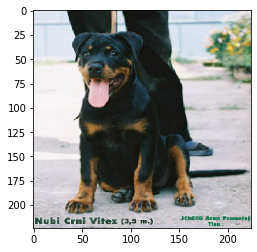

In [24]:
plt.imshow(img)

**Preprocessing**

```
Define constants
```

In [0]:
IMAGE_SIZE = (299, 299)

```
Image preprocessing : usage of ImageDataGenerator class.
Generate batches of tensor image data with real-time data augmentation.
```

In [0]:
def zca_whitening(x):
    x = x - x.mean(axis=0)
    sigma = x.dot(x.T) / float(x.shape[0])
    U, S, Vh = linalg.svd(sigma)
    xRot = U.T.dot(x)
    epsilon = 1e-5
    xPCAWhite = np.diag(1.0 / np.sqrt(S + epsilon)).dot(U.T).dot(x)
    xZCAWhite = U.dot(xPCAWhite)
    return xZCAWhite

In [0]:
def whitening(img):
    channels = cv2.split(img)
    channels[0] = zca_whitening(channels[0])
    #channels[1] = zca_whitening(channels[1])
    #channels[2] = zca_whitening(channels[2])
    img = cv2.merge(channels)
    return img

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


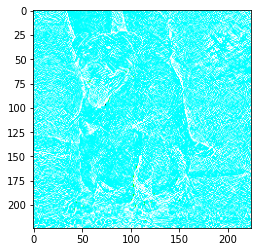

In [28]:
plt.imshow(whitening(img_to_array(img)))

In [0]:
def equalHist(img, adaptive=True):
    img = img.astype(np.uint8)
    ycrcb=cv2.cvtColor(img,cv2.COLOR_BGR2YCR_CB)
    channels=cv2.split(ycrcb)
    if adaptive:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        channels[0] = clahe.apply(channels[0])
    else:
        channels[0] = cv2.equalizeHist(channels[0])
    ycrcb = cv2.merge(channels)
    img = cv2.cvtColor(ycrcb,cv2.COLOR_YCR_CB2BGR)
    return img

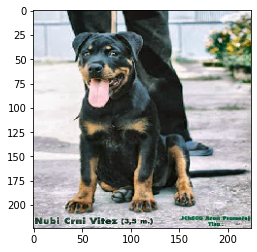

In [30]:
plt.imshow(equalHist(img_to_array(img)))

In [0]:
def preprocessing_image(img):
    #img = whitening(img)
    img = equalHist(img)
    img = tf.keras.applications.inception_resnet_v2.preprocess_input(img)
    return img

In [0]:
# use of the pre-processing function of the model inceptionResNetV2 + equalHist
train_datagen = ImageDataGenerator(preprocessing_function=preprocessing_image)

In [0]:
validation_datagen = ImageDataGenerator(rescale=1./255)

In [27]:
train_generator = train_datagen.flow_from_dataframe(dataframe=train_df,
                                                    directory=dir_train,
                                                    x_col='filename',
                                                    y_col='category',
                                                    target_size=IMAGE_SIZE,
                                                    class_mode='categorical',
                                                    batch_size=32
                                                    )

Found 12240 validated image filenames belonging to 120 classes.


In [26]:
validation_generator = validation_datagen.flow_from_dataframe(dataframe=validate_df,
                                                              directory=dir_train,
                                                              x_col="filename",
                                                              y_col="category",
                                                              target_size=IMAGE_SIZE,
                                                              class_mode="categorical",
                                                              batch_size=32
                                                              )

Found 4200 validated image filenames belonging to 120 classes.


```
See the effects of Histogram Equalization
```

In [0]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen.flow_from_dataframe(dataframe=example_df,
                                                      directory=dir_train,
                                                      x_col='filename',
                                                      y_col='category',
                                                      target_size=IMAGE_SIZE,
                                                      class_mode='categorical',
                                                      batch_size=32
                                                      )

Found 1 validated image filenames belonging to 1 classes.


In [0]:
img = load_img(dir_train + "/" + example_df.loc[0, 'filename'])

In [0]:
X_batch, Y_batch =  next(example_generator)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


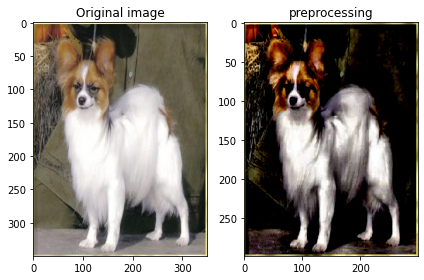

In [0]:
plt.subplot(1, 2, 1)
plt.imshow(img, aspect="auto")
plt.title('Original image')
plt.subplot(1, 2, 2)
plt.imshow(X_batch[0], aspect="auto")
plt.title('preprocessing')
plt.tight_layout()
plt.show()

```
Callbacks : ReduceLROnPlateau, EarlyStopping, TensorBoard
```

In [0]:
# Reduce Learning rate from 3 epochs
learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose=1, factor=0.5, min_lr=0.000001)

In [0]:
# Stop training when the loss metric has stopped improving from 5 epochs
earlystop = EarlyStopping(monitor='val_loss', patience=5)

In [0]:
log_dir = "logs_transfer/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir $log_dir

tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

```
Optimizers : RMSprop. See [Adam optimizer](https://keras.io/optimizers/)
Use for approximate the gradient during back-propagation
```

In [0]:
optimiseur = tf.keras.optimizers.RMSprop(learning_rate=0.01)

**Transfer Learning**

```
Building CNN from 
```

In [31]:
# Load InceptionResNetV2 model with the trained weights for the feature representation layers
inceptionResNetV2_model = tf.keras.applications.InceptionResNetV2(weights='imagenet', include_top=False)

219062272/219055592 [==============================] - 2s 0us/step


In [0]:
x = inceptionResNetV2_model.output

In [0]:
x = GlobalAveragePooling2D()(x)

In [0]:
predictions = Dense(120, activation='softmax', name='predictions')(x)

In [0]:
my_inceptionResNetV2 = tf.keras.models.Model(inputs=inceptionResNetV2_model.input, outputs=predictions)

In [0]:
# We're only training the new classifier
for layer in inceptionResNetV2_model.layers:
    layer.trainable = False

```
Compile and fit model
```

In [0]:
my_inceptionResNetV2.compile(optimizer=optimiseur, loss='categorical_crossentropy', metrics=['accuracy'])

In [38]:
history = my_inceptionResNetV2.fit(train_generator,
                                   epochs=30,
                                   steps_per_epoch=train_df.shape[0]//32,
                                   validation_data=validation_generator,
                                   validation_steps=validate_df.shape[0]//32,
                                   callbacks=[learning_rate_reduction, earlystop]  # Add tensorboard_callback to use tensorboard
                                   )

Epoch 1/30
382/382 [==============================] - 8900s 23s/step - loss: 1.2136 - accuracy: 0.7956 - val_loss: 0.9366 - val_accuracy: 0.8638 - lr: 0.0100
Epoch 2/30
382/382 [==============================] - 146s 383ms/step - loss: 0.8820 - accuracy: 0.8670 - val_loss: 1.1164 - val_accuracy: 0.8593 - lr: 0.0100
Epoch 3/30
382/382 [==============================] - 147s 384ms/step - loss: 0.7621 - accuracy: 0.8842 - val_loss: 1.0991 - val_accuracy: 0.8745 - lr: 0.0100
Epoch 4/30
382/382 [==============================] - 146s 383ms/step - loss: 0.7119 - accuracy: 0.8915 - val_loss: 1.1188 - val_accuracy: 0.8721 - lr: 0.0100
Epoch 5/30
382/382 [==============================] - 146s 382ms/step - loss: 0.6227 - accuracy: 0.9019 - val_loss: 1.2700 - val_accuracy: 0.8733 - lr: 0.0100
Epoch 6/30
382/382 [==============================] - 146s 381ms/step - loss: 0.6019 - accuracy: 0.9060 - val_loss: 1.2158 - val_accuracy: 0.8748 - lr: 0.0100


In [0]:
# Save model
tf.keras.models.save_model(my_inceptionResNetV2, dir_model + "my_inceptionResNetV2.h5")

In [0]:
# Save class indices
save_obj(train_generator.class_indices, 'class_indices')

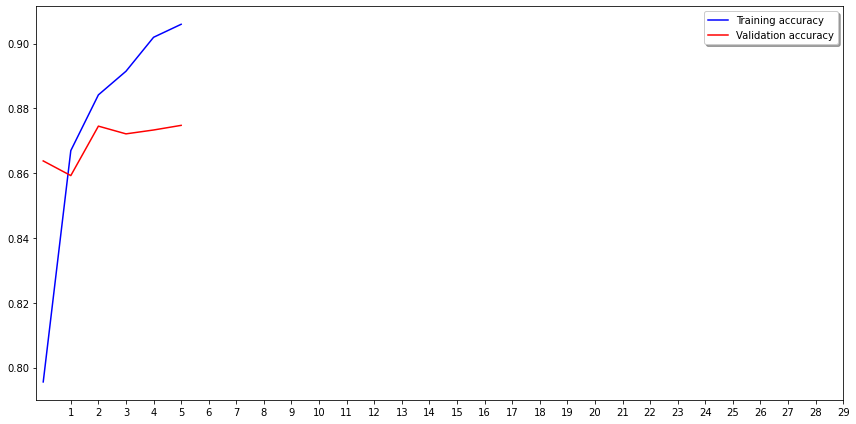

In [39]:
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111)
ax.plot(history.history['accuracy'], color='b', label="Training accuracy")
ax.plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
ax.set_xticks(np.arange(1, 30, 1))
legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

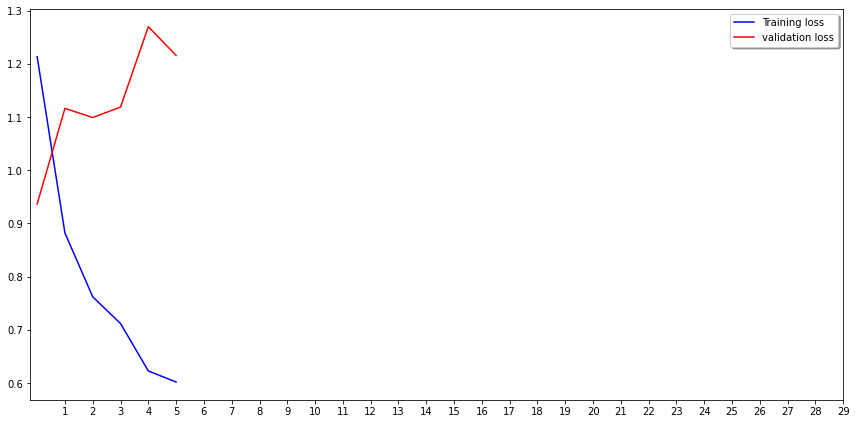

In [40]:
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, autoscale_on=True)
ax.plot(history.history['loss'], color='b', label="Training loss")
ax.plot(history.history['val_loss'], color='r', label="validation loss")
ax.set_xticks(np.arange(1, 30, 1))
legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

```
Evaluation
```

In [0]:
test_datagen = ImageDataGenerator(rescale=1./255)

In [42]:
test_generator = test_datagen.flow_from_dataframe(dataframe=test_df,
                                                  directory=dir_test,
                                                  x_col="filename",
                                                  y_col="category",
                                                  target_size=IMAGE_SIZE,
                                                  class_mode="categorical",
                                                  batch_size=32
                                                  )

Found 4140 validated image filenames belonging to 120 classes.


In [43]:
loss_and_metrics = my_inceptionResNetV2.evaluate(test_generator, batch_size=32, steps=test_df.shape[0]//32)

129/129 [==============================] - 2379s 18s/step - loss: 0.9754 - accuracy: 0.8881


In [44]:
loss_and_metrics

[0.975404679775238, 0.8880813717842102]

```
Extract misclassifications
```

In [0]:
collections = np.array([img_to_array(load_img(dir_test + "/" + row['filename'], target_size=(299, 299))) for i, row in test_df.iterrows()])

In [0]:
collections = np.array([preprocessing_image(collection) for collection in collections])

In [0]:
predict = my_inceptionResNetV2.predict(collections)

In [0]:
test_df['predicted'] = np.argmax(predict, axis=1)  # position of max probability

In [49]:
test_df

,filename,category,widths,heights,predicted
137,n02110185_6438.jpg,Siberian_husky,500,375,24
138,n02110185_7413.jpg,Siberian_husky,500,375,115
139,n02110185_5871.jpg,Siberian_husky,500,375,24
140,n02110185_8360.jpg,Siberian_husky,500,375,24
141,n02110185_1598.jpg,Siberian_husky,500,375,24
...,...,...,...,...,...
20575,n02093647_120.jpg,Bedlington_terrier,237,360,6
20576,n02093647_2585.jpg,Bedlington_terrier,237,360,6
20577,n02093647_2068.jpg,Bedlington_terrier,237,360,6
20578,n02093647_3219.jpg,Bedlington_terrier,237,360,6


In [0]:
# Correspondence position category
label_map = dict((v,k) for k,v in test_generator.class_indices.items())
test_df['predicted'] = test_df['predicted'].replace(label_map)

In [51]:
test_df

,filename,category,widths,heights,predicted
137,n02110185_6438.jpg,Siberian_husky,500,375,Eskimo_dog
138,n02110185_7413.jpg,Siberian_husky,500,375,toy_poodle
139,n02110185_5871.jpg,Siberian_husky,500,375,Eskimo_dog
140,n02110185_8360.jpg,Siberian_husky,500,375,Eskimo_dog
141,n02110185_1598.jpg,Siberian_husky,500,375,Eskimo_dog
...,...,...,...,...,...
20575,n02093647_120.jpg,Bedlington_terrier,237,360,Bedlington_terrier
20576,n02093647_2585.jpg,Bedlington_terrier,237,360,Bedlington_terrier
20577,n02093647_2068.jpg,Bedlington_terrier,237,360,Bedlington_terrier
20578,n02093647_3219.jpg,Bedlington_terrier,237,360,Bedlington_terrier


In [52]:
# Misclassifications
error_df = test_df[test_df['category'] != test_df['predicted']]
error_df.shape[0]

485

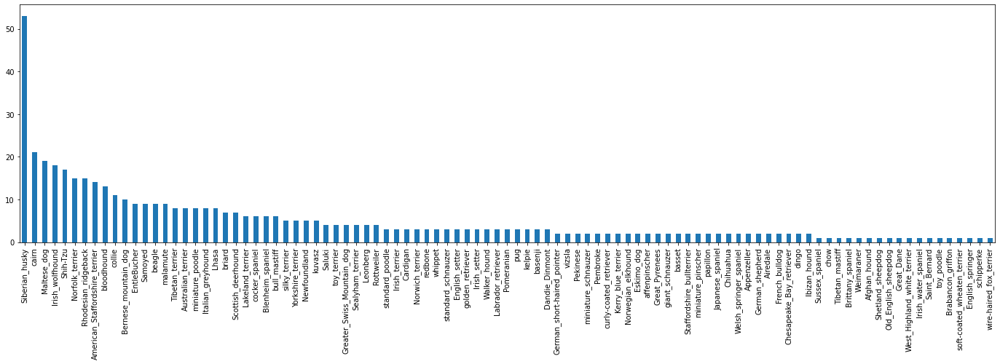

In [53]:
plt.figure(figsize=(24, 6))
error_df['category'].value_counts().plot.bar()

In [54]:
error_df[['category', 'predicted']].groupby('category').describe()

predicted                                       
                                   count unique                        top freq
category                                                                       
Afghan_hound                           1      1               Newfoundland    1
Airedale                               2      2              Irish_terrier    1
American_Staffordshire_terrier        14      4  Staffordshire_bullterrier   11
Appenzeller                            2      2                EntleBucher    1
Australian_terrier                     8      3              silky_terrier    4
...                                  ...    ...                        ...  ...
toy_poodle                             1      1           miniature_poodle    1
toy_terrier                            4      3                    basenji    2
vizsla                                 2      2                 Weimaraner    1
whippet                                3      2          Italian_greyhound    2
wire-haired_fox_terrier                1      1           Lakeland_terrier    1

[97 rows x 4 columns]

In [0]:
errors_sypnosis = pd.DataFrame(columns=['category', 'list_errors'])
for category in set(error_df['category'].values):
    list_errors = "| "
    for i, row in error_df.iterrows():
        if row['category'] == category:
            list_errors += row['predicted'] + " | " 
    errors_sypnosis = errors_sypnosis.append({'category': category, 'list_errors': list_errors}, ignore_index=True)

In [56]:
display(errors_sypnosis)

,category,list_errors
0,bull_mastiff,| Labrador_retriever | Brabancon_griffon | cho...
1,Norwich_terrier,| Scottish_deerhound | West_Highland_white_ter...
2,Tibetan_terrier,| otterhound | soft-coated_wheaten_terrier | L...
3,Cardigan,| Pembroke | Pembroke | Pembroke |
4,Irish_wolfhound,| Scottish_deerhound | Scottish_deerhound | Sc...
...,...,...
92,Siberian_husky,| Eskimo_dog | toy_poodle | Eskimo_dog | Eskim...
93,Eskimo_dog,| malamute | Siberian_husky |
94,Japanese_spaniel,| Shih-Tzu | Blenheim_spaniel |
95,golden_retriever,| Great_Pyrenees | cocker_spaniel | Great_Pyre...


**Data augmentation : to improve performance**

In [0]:
# Parameters estimated from misclassifications that detect them(empirical)
train_datagen_aug = ImageDataGenerator(rotation_range=30,
                                       width_shift_range=0.1,
                                       height_shift_range=0.1,
                                       shear_range=0.01,
                                       zoom_range=0.1,
                                       horizontal_flip=True,
                                       brightness_range=[0.5, 1.5],
                                       preprocessing_function=preprocessing_image
                                       )

In [59]:
train_generator_aug = train_datagen_aug.flow_from_dataframe(dataframe=train_df,
                                                            directory=dir_train,
                                                            x_col='filename',
                                                            y_col='category',
                                                            target_size=IMAGE_SIZE,
                                                            class_mode='categorical',
                                                            batch_size=32
                                                            )

Found 12240 validated image filenames belonging to 120 classes.


```
See how the generator work
```

In [62]:
example_df = train_df.sample(n=1).reset_index(drop=True)
example_generator = train_datagen_aug.flow_from_dataframe(dataframe=example_df,
                                                           directory=dir_train,
                                                           x_col='filename',
                                                           y_col='category',
                                                           target_size=IMAGE_SIZE,
                                                           class_mode='categorical',
                                                           batch_size=32
                                                          )

Found 1 validated image filenames belonging to 1 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


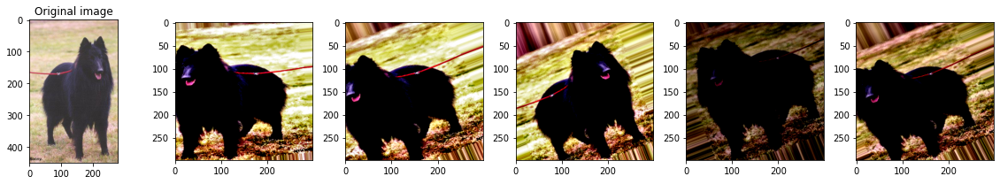

In [63]:
img = load_img(dir_train + "/" + example_df.loc[0, 'filename'])
plt.figure(figsize=(16, 3))
plt.subplot(1, 6, 1)
plt.imshow(img, aspect=True)
plt.title('Original image')
for i in range(1, 6):
    plt.subplot(1, 6, i+1)
    for X_batch, Y_batch in example_generator:
        image = X_batch[0]
        plt.imshow(image, aspect=True)
        break
plt.tight_layout()
#plt.subtitle('Original image on the left, augmented on the other images')
plt.show()

```
See if there is a gain in performance
```

In [64]:
history_aug = my_inceptionResNetV2.fit(train_generator_aug,
                                       epochs=30,
                                       steps_per_epoch=train_df.shape[0]//32,
                                       validation_data=validation_generator,
                                       validation_steps=validate_df.shape[0]//32,
                                       callbacks=[learning_rate_reduction, earlystop]
                                       )

Epoch 1/30
382/382 [==============================] - 406s 1s/step - loss: 1.4635 - accuracy: 0.8377 - val_loss: 1.2315 - val_accuracy: 0.8700 - lr: 0.0100
Epoch 2/30
382/382 [==============================] - 399s 1s/step - loss: 1.4446 - accuracy: 0.8372 - val_loss: 1.1172 - val_accuracy: 0.8771 - lr: 0.0100
Epoch 3/30
382/382 [==============================] - 396s 1s/step - loss: 1.3201 - accuracy: 0.8495 - val_loss: 1.2262 - val_accuracy: 0.8717 - lr: 0.0100
Epoch 4/30
382/382 [==============================] - 393s 1s/step - loss: 1.2951 - accuracy: 0.8462 - val_loss: 1.2033 - val_accuracy: 0.8700 - lr: 0.0100
Epoch 5/30
382/382 [==============================] - ETA: 0s - loss: 1.2972 - accuracy: 0.8508
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
382/382 [==============================] - 394s 1s/step - loss: 1.2972 - accuracy: 0.8508 - val_loss: 1.1955 - val_accuracy: 0.8702 - lr: 0.0100
Epoch 6/30
382/382 [==============================] - 39

```
Evaluation
```

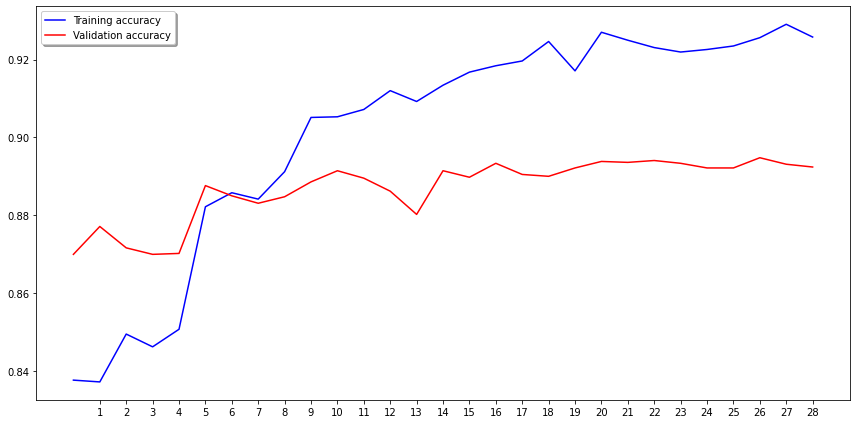

In [65]:
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111)
ax.plot(history_aug.history['accuracy'], color='b', label="Training accuracy")
ax.plot(history_aug.history['val_accuracy'], color='r',label="Validation accuracy")
ax.set_xticks(np.arange(1, 29, 1))
legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

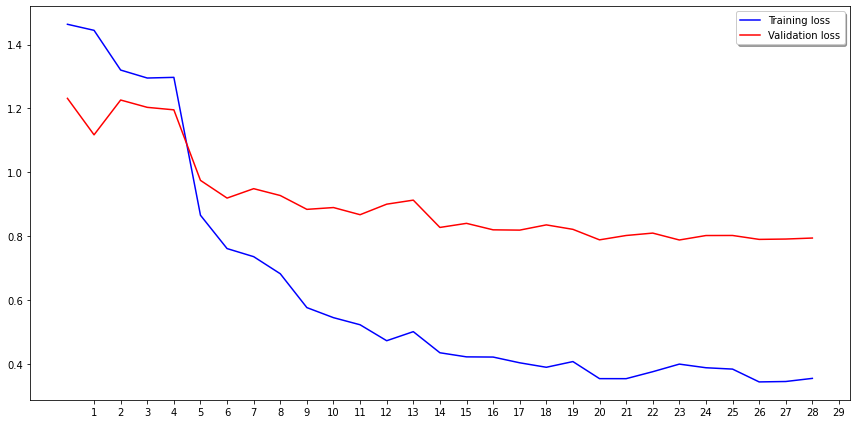

In [66]:
fig = plt.figure(figsize=(12, 6))
ax = fig.add_subplot(111, autoscale_on=True)
ax.plot(history_aug.history['loss'], color='b', label="Training loss")
ax.plot(history_aug.history['val_loss'], color='r', label="Validation loss")
ax.set_xticks(np.arange(1, 30, 1))
legend = plt.legend(loc='best', shadow=True)
plt.tight_layout()
plt.show()

In [67]:
loss_and_metrics_aug = my_inceptionResNetV2.evaluate(test_generator, batch_size=32, steps=test_df.shape[0]//32)

129/129 [==============================] - 30s 229ms/step - loss: 0.6266 - accuracy: 0.9135


In [68]:
loss_and_metrics_aug

[0.62655109167099, 0.913517415523529]

**Build from scratch**

```
preprocessing function
```

In [0]:
def preprocessing_from_scratch(img):
    return equalHist(img)

```
Based on VGG16 model : reduce layers and dimensions
```

```
Modify image size input
```

In [0]:
# use of the pre-processing function of the model inceptionResNetV2
vgg16_train_datagen = ImageDataGenerator(rotation_range=20,
                                         width_shift_range=0.1,
                                         height_shift_range=0.1,
                                         shear_range=0.01,
                                         zoom_range=0.1,
                                         horizontal_flip=True,
                                         brightness_range=[0.5, 1.5],
                                         preprocessing_function=preprocessing_from_scratch
                                         )

In [0]:
vgg16_validation_datagen = ImageDataGenerator(rescale=1./255)

In [72]:
vgg16_train_generator = vgg16_train_datagen.flow_from_dataframe(dataframe=train_df,
                                                                directory=dir_train,
                                                                x_col='filename',
                                                                y_col='category',
                                                                target_size=(224, 224),
                                                                class_mode='categorical',
                                                                batch_size=32
                                                                )

Found 12240 validated image filenames belonging to 120 classes.


In [73]:
vgg16_validation_generator = vgg16_validation_datagen.flow_from_dataframe(dataframe=validate_df,
                                                                          directory=dir_train,
                                                                          x_col='filename',
                                                                          y_col='category',
                                                                          target_size=(224, 224),
                                                                          class_mode='categorical',
                                                                          batch_size=32
                                                                          )

Found 4200 validated image filenames belonging to 120 classes.


In [0]:
my_VGG16 = tf.keras.models.Sequential()

In [0]:
# Block 1
my_VGG16.add(Conv2D(64,(3, 3), input_shape=(224, 224, 3), padding='same', activation='relu'))

my_VGG16.add(Conv2D(64,(3, 3), padding='same', activation='relu'))

my_VGG16.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

In [0]:
# Block2
my_VGG16.add(Conv2D(128, (3, 3), padding='same', activation='relu'))

my_VGG16.add(Conv2D(128, (3, 3), padding='same', activation='relu'))

my_VGG16.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

In [0]:
# Block3
my_VGG16.add(Conv2D(256, (3, 3), padding='same', activation='relu'))

my_VGG16.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

In [0]:
# Block4
my_VGG16.add(Conv2D(512, (3, 3), padding='same', activation='relu'))

my_VGG16.add(Conv2D(512, (3, 3), padding='same', activation='relu'))

my_VGG16.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

In [0]:
# Block5
my_VGG16.add(Conv2D(512, (3, 3), padding='same', activation='relu'))

my_VGG16.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

In [0]:
# Fully-connected classifier
my_VGG16.add(Flatten())
my_VGG16.add(Dense(2048, activation='relu'))
my_VGG16.add(Dense(2048, activation='relu'))
my_VGG16.add(Dense(120, activation='softmax'))

In [0]:
my_VGG16.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [82]:
history_vgg16 = my_VGG16.fit(vgg16_train_generator,
                             epochs=30,
                             steps_per_epoch=train_df.shape[0]//32,
                             validation_data=vgg16_validation_generator,
                             validation_steps=validate_df.shape[0]//32,
                             callbacks=[learning_rate_reduction, earlystop]
                             )

Epoch 1/30
382/382 [==============================] - 273s 713ms/step - loss: 81.5608 - accuracy: 0.0074 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 2/30
382/382 [==============================] - 271s 708ms/step - loss: 4.8113 - accuracy: 0.0064 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 3/30
382/382 [==============================] - 272s 712ms/step - loss: 4.8540 - accuracy: 0.0072 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 4/30
382/382 [==============================] - ETA: 0s - loss: 4.8599 - accuracy: 0.0070
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
382/382 [==============================] - 273s 716ms/step - loss: 4.8599 - accuracy: 0.0070 - val_loss: 4.7877 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 5/30
382/382 [==============================] - 273s 715ms/step - loss: 4.7883 - accuracy: 0.0084 - val_loss: 4.7878 - val_accuracy: 0.0083 - lr: 5.0000e-04
Epoch 6/30
382/382 [===============

```
Evaluation
```

In [0]:
vgg16_test_datagen = ImageDataGenerator(rescale=1./255)

In [84]:
vgg16_test_generator = vgg16_test_datagen.flow_from_dataframe(dataframe=test_df,
                                                              directory=dir_test,
                                                              x_col='filename',
                                                              y_col='category',
                                                              target_size=(224, 224),
                                                              class_mode='categorical',
                                                              batch_size=32
                                                              )

Found 4140 validated image filenames belonging to 120 classes.


In [85]:
loss_and_metrics_v = my_VGG16.evaluate(vgg16_test_generator, batch_size=32, steps=test_df.shape[0]//32)

129/129 [==============================] - 25s 194ms/step - loss: 5.8860 - accuracy: 0.0046


In [86]:
loss_and_metrics_v

[5.885979652404785, 0.004602713044732809]

```
Based on Xception model
```

In [0]:
Xception_train_datagen = ImageDataGenerator(rotation_range=20,
                                            width_shift_range=0.1,
                                            height_shift_range=0.1,
                                            shear_range=0.01,
                                            zoom_range=0.1,
                                            horizontal_flip=True,
                                            brightness_range=[0.5, 1.5],
                                            preprocessing_function=preprocessing_from_scratch
                                            )

In [88]:
Xception_train_generator = Xception_train_datagen.flow_from_dataframe(dataframe=train_df,
                                                                      directory=dir_train,
                                                                      x_col='filename',
                                                                      y_col='category',
                                                                      target_size=(299, 299),
                                                                      class_mode='categorical',
                                                                      batch_size=32
                                                                      )

Found 12240 validated image filenames belonging to 120 classes.


In [0]:
# Entry flow
main_input = tf.keras.Input(shape=(299, 299, 3), name='main_input')

x = Conv2D(32, (3, 3), strides=(2,2), activation='relu', padding="same")(main_input)
x = Conv2D(64, (3, 3), activation='relu', padding="same")(x)

tower_1 = Conv2D(1, (1, 1), strides=(2,2))(x)

x = SeparableConv2D(128, (3, 3), padding='same')(x)

x = Activation('relu')(x)
x = SeparableConv2D(128, (3, 3), padding='same')(x)

x = MaxPooling2D(pool_size=(3, 3), strides=(2,2), padding="same")(x)

x = concatenate([x, tower_1], axis=-1)

tower_2 = Conv2D(1, (1, 1), strides=(2,2))(tower_1)

x = Activation('relu')(x)
x = SeparableConv2D(256, (3, 3), padding="same")(x)

x = Activation('relu')(x)
x = SeparableConv2D(256, (3, 3), padding="same")(x)

x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same")(x)

x = concatenate([x, tower_2], axis=-1)

tower_3 = Conv2D(1, (1, 1), strides=(2,2))(tower_2)

x = Activation('relu')(x)
x = SeparableConv2D(768, (3, 3), padding="same")(x)

x = Activation('relu')(x)
x = SeparableConv2D(768, (3, 3), padding="same")(x)

x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same")(x)

x = concatenate([x, tower_3], axis=-1)

In [0]:
# Middle flow : repeat 4 fois
for i in range(4):
    y = Activation('relu')(x)
    y = SeparableConv2D(728, (3, 3), padding="same")(y)

    y = Activation('relu')(y)
    y = SeparableConv2D(728, (3, 3), padding="same")(y)

    y = Activation('relu')(y)
    y = SeparableConv2D(728, (3, 3), padding="same")(y)

    x = concatenate([x, y])

In [0]:
# Exit flow
tower_4 = Conv2D(1, (1, 1), strides=(2,2))(x)

x = Activation('relu')(x)
x = SeparableConv2D(728, (3, 3), padding="same")(x)

x = Activation('relu')(x)
x = SeparableConv2D(1024, (3, 3), padding="same")(x)

x = MaxPooling2D(pool_size=(3, 3), strides=(2, 2), padding="same")(x)

x = concatenate([x, tower_4])

x = SeparableConv2D(1536, (3, 3), activation='relu', padding="same")(x)
x = SeparableConv2D(2048, (3, 3), activation='relu', padding="same")(x)

x = GlobalAveragePooling2D()(x)

x = Flatten()(x)
x = Dense(2048, activation='relu')(x)
x = Dense(1024, activation='relu')(x)
x = Dense(120, activation='softmax')(x)

In [0]:
my_Xception = tf.keras.Model(inputs=main_input, outputs=x)

In [0]:
my_Xception.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [94]:
history_Xception = my_Xception.fit(Xception_train_generator,
                                   epochs=30,
                                   steps_per_epoch=train_df.shape[0]//32,
                                   validation_data=validation_generator,
                                   validation_steps=validate_df.shape[0]//32,
                                   callbacks=[learning_rate_reduction, earlystop]
                                   )

Epoch 1/30
382/382 [==============================] - 429s 1s/step - loss: 4.7893 - accuracy: 0.0069 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 2/30
382/382 [==============================] - 416s 1s/step - loss: 4.7889 - accuracy: 0.0056 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 3/30
382/382 [==============================] - 415s 1s/step - loss: 4.7885 - accuracy: 0.0065 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 0.0010
Epoch 4/30
382/382 [==============================] - ETA: 0s - loss: 4.7885 - accuracy: 0.0079
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
382/382 [==============================] - 414s 1s/step - loss: 4.7885 - accuracy: 0.0079 - val_loss: 4.7875 - val_accuracy: 0.0081 - lr: 0.0010
Epoch 5/30
382/382 [==============================] - 417s 1s/step - loss: 4.7880 - accuracy: 0.0072 - val_loss: 4.7875 - val_accuracy: 0.0083 - lr: 5.0000e-04
Epoch 6/30
382/382 [==============================]

```
Evaluation
```

In [95]:
loss_and_metrics_x = my_Xception.evaluate(test_generator, batch_size=32, steps=test_df.shape[0]//32)

129/129 [==============================] - 28s 218ms/step - loss: 4.7874 - accuracy: 0.0041


In [96]:
loss_and_metrics_x

[4.787434101104736, 0.004118217155337334]